# **Geographically Weighted Regression Analysis of House Prices in Jabodetabek**

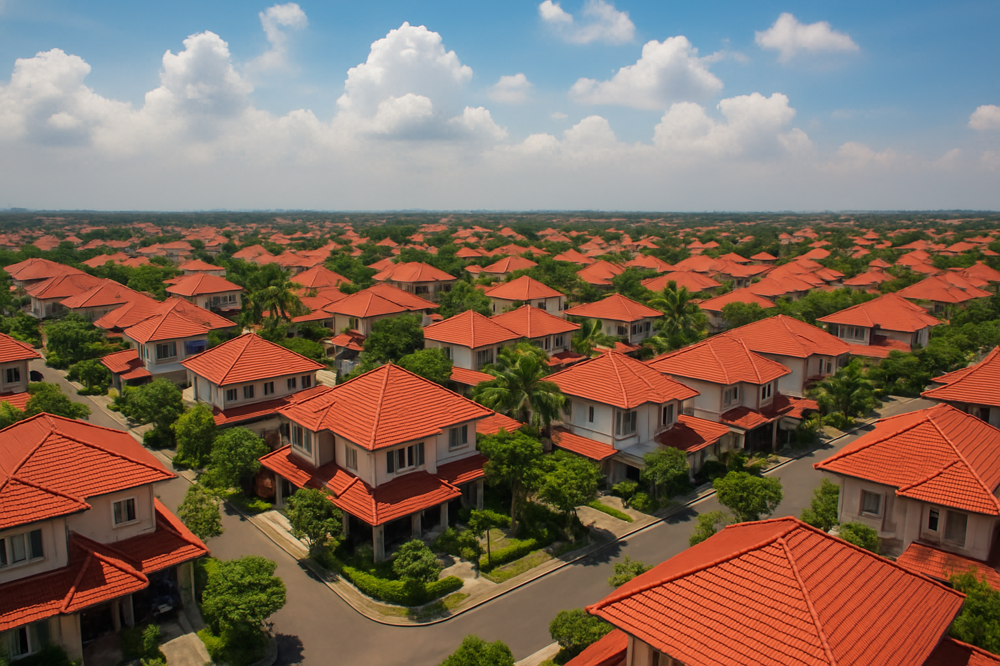


The Jabodetabek region (Jakarta, Bogor, Depok, Tangerang, and Bekasi) is one of the most densely populated and economically significant metropolitan areas in Indonesia. The housing market in this region exhibits considerable variation due to diverse urban development patterns, accessibility to infrastructure, socio-economic factors, and geographic disparities.

To better understand the spatial dynamics of housing prices, this analysis applies a Geographically Weighted Regression (GWR) approach. Unlike traditional linear regression models that assume global homogeneity in relationships, GWR allows the coefficients to vary spatially—capturing local heterogeneity in how factors like the number of bedrooms, land area, building size, and number of floors influence housing prices.

By transforming house prices into logarithmic values, we improve model stability and meet the assumptions required for robust regression analysis. The GWR model demonstrates significantly improved performance compared to ordinary least squares (OLS), achieving a high adjusted R² of 0.842. This reveals that spatial variation plays a key role in shaping housing price determinants across different neighborhoods in Jabodetabek.

This study provides valuable insights for urban planners, developers, and policymakers seeking to understand local market conditions and develop more targeted housing policies based on spatial evidence.
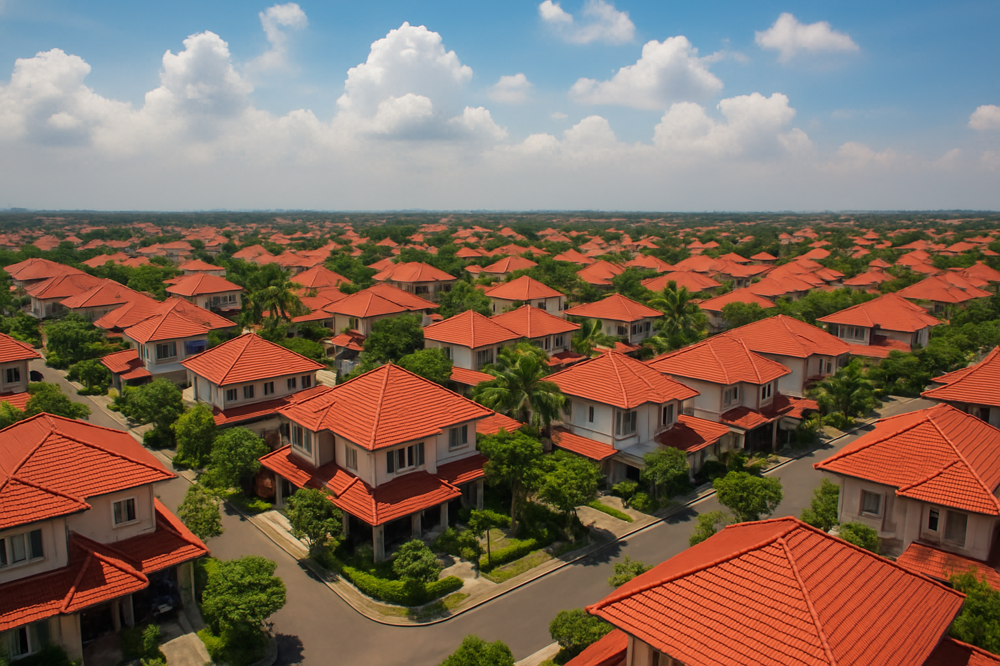

## **Import Libraries**

In [34]:
!pip install mgwr
!pip install contextily
!pip install esda

In [35]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point, MultiPoint
from sklearn.preprocessing import StandardScaler
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import contextily as ctx
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan, normal_ad
from esda.moran import Moran
from libpysal.weights import DistanceBand
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore")

## **Load Data**

In [36]:
df = pd.read_csv('/kaggle/input/daftar-harga-rumah-jabodetabek/jabodetabek_house_price.csv')
df = df[['price_in_rp', 'bedrooms', 'bathrooms', 'land_size_m2', 'building_size_m2', 'floors', 'lat', 'long']]
df.dropna(inplace=True)
df = df[(df['price_in_rp'] > 1e6) & (df['lat'] < 0)]
df['log_price'] = np.log(df['price_in_rp'])
df.head()

,price_in_rp,bedrooms,bathrooms,land_size_m2,building_size_m2,floors,lat,long,log_price
0,2.990000e+09,4.0,4.0,239.0,272.0,2.0,-6.223945,106.986275,21.818539
1,1.270000e+09,3.0,2.0,55.0,69.0,2.0,-6.223945,106.986275,20.962283
2,1.950000e+09,3.0,3.0,119.0,131.0,2.0,-6.223945,106.986275,21.391095
3,3.300000e+09,3.0,3.0,180.0,174.0,2.0,-6.223945,106.986275,21.917188
4,4.500000e+09,4.0,3.0,328.0,196.0,2.0,-6.223945,106.986275,22.227343


## **GeoDataFrame + Meter Projection**

In [37]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['long'], df['lat']))
gdf.crs = 'EPSG:4326'
gdf = gdf.to_crs(epsg=3857)

## **Spatial Outlier Filtering**

In [38]:
center = MultiPoint(list(gdf.geometry)).centroid
gdf['dist_center'] = gdf.geometry.distance(center)
gdf = gdf[gdf['dist_center'] < gdf['dist_center'].quantile(0.98)]

## **Exploration**

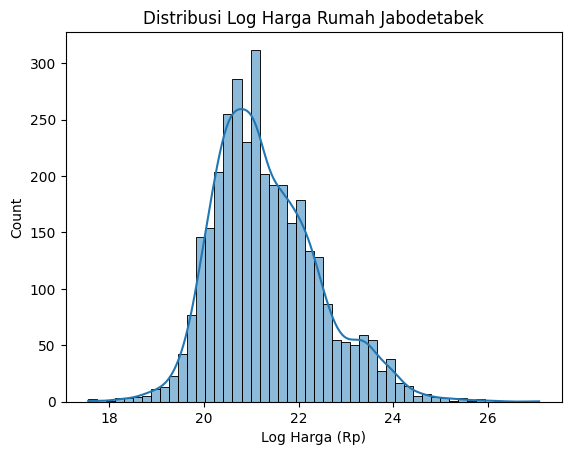

In [39]:
sns.histplot(gdf['log_price'], bins=50, kde=True)
plt.title('Distribusi Log Harga Rumah Jabodetabek')
plt.xlabel('Log Harga (Rp)')
plt.show()

## **Global OLS Test (optional for comparison)**

In [40]:
X_ols = gdf[['bedrooms', 'bathrooms', 'land_size_m2', 'building_size_m2', 'floors']]
X_ols = sm.add_constant(X_ols)
y_ols = gdf['log_price']
ols_model = sm.OLS(y_ols, X_ols).fit()
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.617
Model:                            OLS   Adj. R-squared:                  0.616
Method:                 Least Squares   F-statistic:                     1104.
Date:                Thu, 19 Jun 2025   Prob (F-statistic):               0.00
Time:                        12:24:07   Log-Likelihood:                -3630.3
No. Observations:                3439   AIC:                             7273.
Df Residuals:                    3433   BIC:                             7309.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               19.8735      0.041  

## **Normality and Heteroscedasticity of the OLS Model**

In [41]:
print("P-value Normalitas Residual:", normal_ad(ols_model.resid)[1])
print("Breusch-Pagan p-value:", het_breuschpagan(ols_model.resid, X_ols)[1])

P-value Normalitas Residual: 0.0
Breusch-Pagan p-value: 2.9176727357597147e-256


## **VIF of the OLS Model**

In [42]:
vif_df = pd.DataFrame()
vif_df['feature'] = X_ols.columns
vif_df['VIF'] = [variance_inflation_factor(X_ols.values, i) for i in range(X_ols.shape[1])]
print(vif_df)

            feature        VIF
0             const  11.646639
1          bedrooms  10.033774
2         bathrooms  11.085705
3      land_size_m2   1.539648
4  building_size_m2   2.529681
5            floors   1.272291


## **Moran's I for Residual Spatial Autocorrelation**

In [43]:
w = DistanceBand.from_dataframe(gdf, threshold=5000, silence_warnings=True)
moran_resid = Moran(ols_model.resid, w)
print("Moran's I Residual:", moran_resid.I, "| p-value:", moran_resid.p_sim)

Moran's I Residual: 0.1614981898296272 | p-value: 0.001


## **Standardization**

In [44]:
coords = np.column_stack([gdf.geometry.x, gdf.geometry.y])
X = gdf[['bedrooms', 'bathrooms', 'land_size_m2', 'building_size_m2', 'floors']].values
y = gdf['log_price'].values.reshape((-1, 1))
scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)
scaler_y = StandardScaler()
y_scaled = scaler_y.fit_transform(y)

## **Bandwith Selection**

In [49]:
bw = Sel_BW(coords, y_scaled, X_scaled).search(bw_min=2)
print("Best Bandwidth:", bw)

Best Bandwidth: 312.0


## **Fit GWR Model**

In [46]:
gwr_model = GWR(coords, y_scaled, X_scaled, bw)
gwr_results = gwr_model.fit()
print(gwr_results.summary())

Model type                                                         Gaussian
Number of observations:                                                3439
Number of covariates:                                                     6

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1318.429
Log-likelihood:                                                   -3231.177
AIC:                                                               6474.353
AICc:                                                              6476.386
BIC:                                                             -26636.270
R2:                                                                   0.617
Adj. R2:                                                              0.616

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

## **Local R² Mapping**

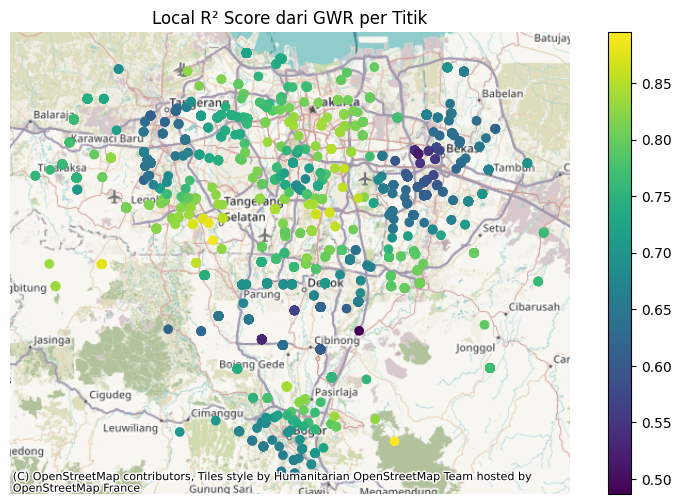

In [47]:
gdf['gwr_r2'] = gwr_results.localR2
fig, ax = plt.subplots(figsize=(10, 6))
gdf.plot(column='gwr_r2', cmap='viridis', legend=True, ax=ax)
ctx.add_basemap(ax, crs=gdf.crs)
plt.title('Local R² Score dari GWR per Titik')
plt.axis('off')
plt.show()

## **Local Coefficients per Variable**

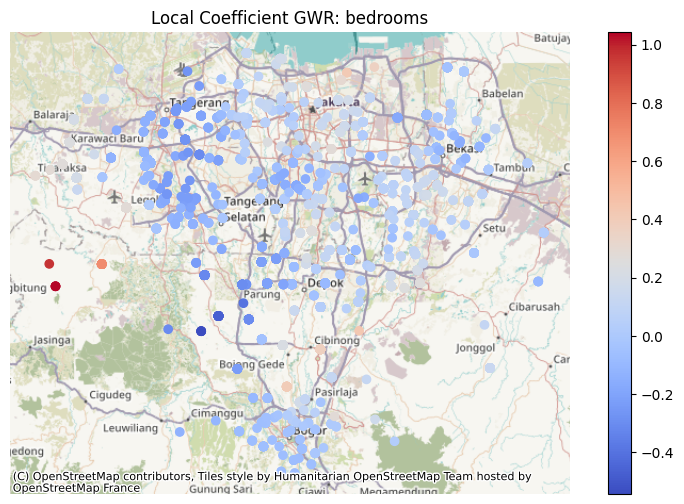

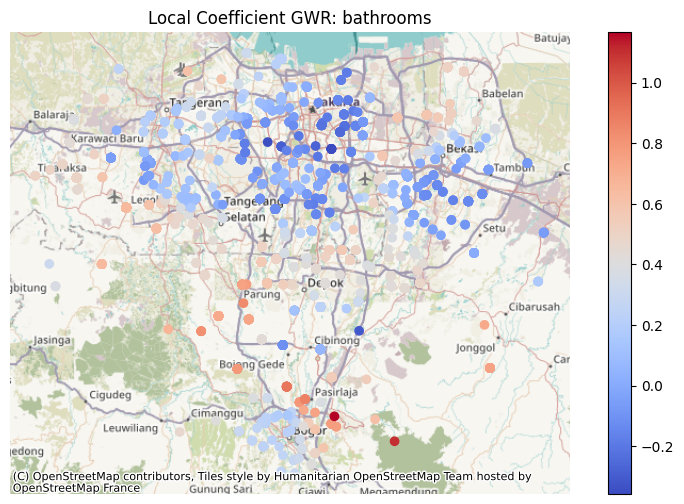

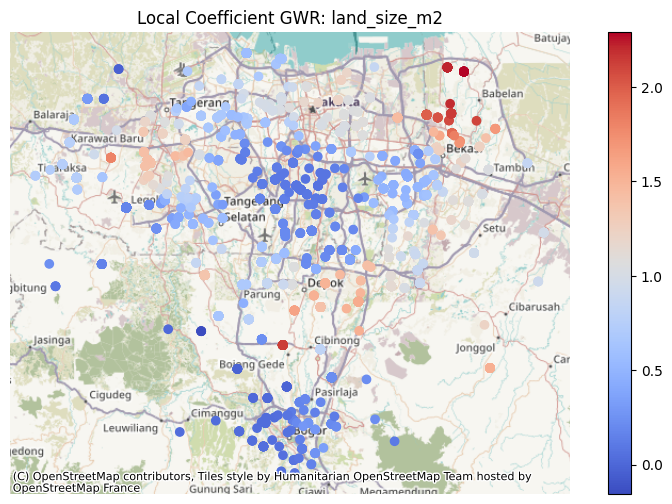

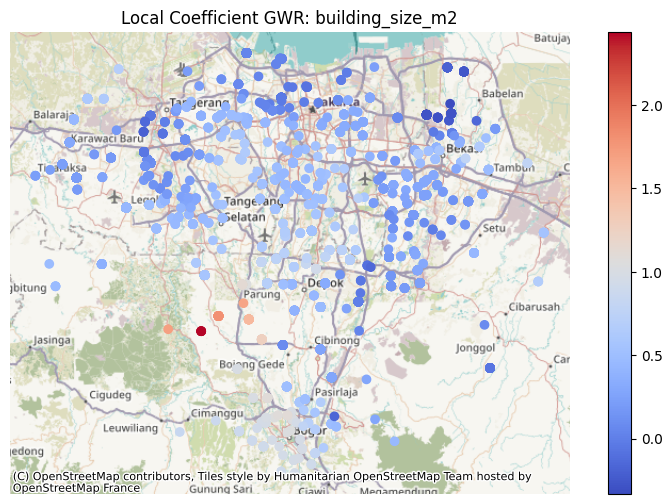

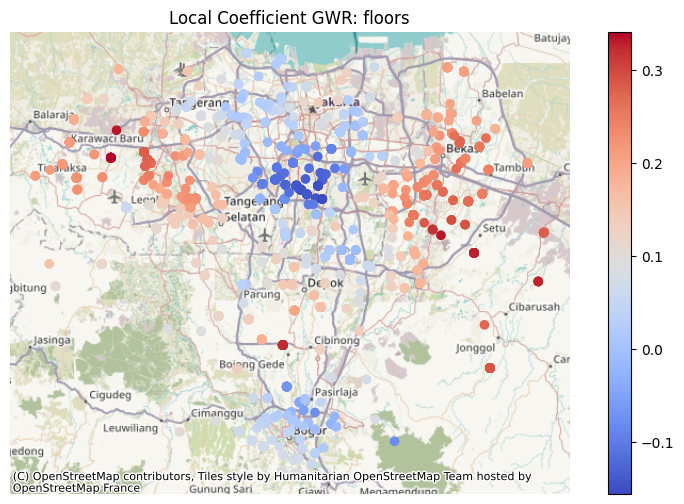

In [48]:
columns = ['bedrooms', 'bathrooms', 'land_size_m2', 'building_size_m2', 'floors']
for i, col in enumerate(columns):
    gdf[f'gwr_{col}'] = gwr_results.params[:, i + 1]
    fig, ax = plt.subplots(figsize=(10, 6))
    gdf.plot(column=f'gwr_{col}', cmap='coolwarm', legend=True, ax=ax)
    ctx.add_basemap(ax, crs=gdf.crs)
    plt.title(f'Local Coefficient GWR: {col}')
    plt.axis('off')
    plt.show()

## **Conclusion**

The Geographically Weighted Regression (GWR) model outperforms the global Ordinary Least Squares (OLS) model significantly:

| Model | R-squared | Adjusted R-squared | Residual Sum of Squares |
|-------|-----------|--------------------|--------------------------|
| OLS   | 0.617     | 0.616              | 1318.43                  |
| GWR   | 0.849     | 0.842              | 517.65                   |

GWR also reveals spatial heterogeneity in the influence of key predictors:
- `bedrooms` and `bathrooms` show varying impacts depending on location (both positive and negative in different areas).
- `land_size_m2`, `building_size_m2`, and `floors` contribute positively across most regions but with differing magnitudes.


The GWR model provides a much more nuanced and accurate understanding of house price determinants in Jabodetabek. It captures local variations in the relationship between housing characteristics and price, which are overlooked by traditional global models. This spatial insight is highly valuable for urban planners, policymakers, and developers aiming for location-specific strategies in the housing market.
